## Import das bibliotecas utilizadas


In [1]:
import pandas as pd
import numpy as np
import openpyxl
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import multimode
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt



### Carregamento dos dados para a parte de Modelagem

In [2]:
df_transposed_copy_inputting_v19 = pd.read_csv(r'../../Projeto/Data/Output/df_transposed_copy_inputting_v19.csv')


## Modelagem

Modelos de Forecasting são divididos em partes pré e pós período desejado para previsão. Os períodos utilizados devem ser equiparáveis ao tipo de questão analisada.

In [3]:
df_model = df_transposed_copy_inputting_v19.copy()

In [4]:
df_model['year'] = pd.to_datetime(df_model['year'], format='ISO8601')


In [5]:
df_model.set_index('year', inplace = True)
df_model.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 49 entries, 1980-01-01 to 2028-01-01
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 87.7 KB


In [6]:
df_model.head(5)

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,4.345486,2.7,-5.4,2.877381,2.4,8.2,0.7,5.290000,5.399885,2.9,...,-0.8,3.3,3.988678,1.8,6.4,0.9,-1.9,3.8,3.991920,2.1
1981-01-01,7.200000,5.7,3.0,0.385714,-4.4,3.8,-5.7,3.798462,-3.624698,4.1,...,-0.5,1.9,1.792949,0.1,0.9,2.0,-0.2,4.2,4.567689,1.9
1982-01-01,5.116667,2.9,6.4,0.371429,0.0,-0.1,-3.1,2.306923,4.538833,0.1,...,1.4,1.5,5.395555,0.6,-0.5,-0.1,0.4,2.2,8.037341,0.7
1983-01-01,4.283333,1.1,5.4,1.471429,4.2,5.4,3.7,0.815385,1.930603,-0.5,...,4.6,1.8,4.752000,1.7,-2.8,3.3,0.7,4.0,3.300508,2.6
1984-01-01,6.166667,2.0,5.6,2.585714,6.0,10.2,2.0,-0.676154,-15.680825,6.3,...,4.1,4.1,-0.599934,2.5,3.9,5.0,0.3,6.6,5.023940,4.6


#### Training and Test set

In [7]:
test_years = 6
train_data = df_model.iloc[:-test_years, :]
train_data.tail(1)

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
2022-01-01,3.55,3.7,2.9,8.7,2.8,6.4,5.2,12.6,5.7,3.7,...,0.8,4.0,3.5,3.7,4.0,2.3,5.3,2.6,3.9,3.4


In [8]:
test_data = df_model.iloc[-test_years:, :]
test_data.tail(1)


,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
2028-01-01,5.033333,3.4,1.8,1.5,4.2,2.7,2.0,4.5,1.1,2.3,...,2.3,3.9,1.4,1.7,2.3,1.6,3.7,2.3,4.4,3.0


### Exponential Smoothing

No método Exponential Smoothing os dados mais recentes possuem maior relevância para a análise, em comparação aos dados mais antigos. 

#### Holt-Winters

O método de Holt-Winters divide a série temporal em 3 níveis, sendo eles: 
- Level (passado mais recente do conjunto de dados)
- Trend
- Seasonality

Um exponential smoothing é realizado em cada um dos três níveis. É considerado uma abordagem simples onde, muitas vezes, as predições não acompanham os dados de teste.

In [9]:
#Forecasting Model
df_predictions_hw = pd.DataFrame()

for country in df_model.columns: 
    model_hw = ExponentialSmoothing(endog = train_data[country], trend ='add', seasonal = 'add', seasonal_periods= 4).fit()
    predictions_hw = model_hw.forecast(steps= len(test_data[country])).rename('Holt-Winters')
    df_predictions_hw = pd.concat([df_predictions_hw, pd.DataFrame(predictions_hw.values, columns=[country])], axis=1)


/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)


/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, 

In [10]:
df_predictions_hw

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
0,2.926268,2.881231,1.947427,5.380282,1.513252,0.406658,4.165323,10.998680,1.866910,2.113211,...,3.538766,4.307256,1.908446,1.882666,1.490611,1.366653,4.934880,2.630645,2.383047,3.854663
1,1.702371,4.181356,0.557566,3.398252,2.287834,-0.521834,2.131098,8.013137,-1.168633,2.692837,...,2.588182,3.974494,-0.296240,0.928363,2.133447,0.845444,4.899350,2.157097,2.277882,3.406905
2,3.775499,5.717770,1.903017,5.070463,0.533289,-1.140022,1.512858,7.552581,2.446750,3.201800,...,2.442539,3.965408,0.392976,1.119272,2.224322,1.054537,4.072090,1.929804,2.625136,3.515994
3,1.567929,5.454033,1.857539,5.850963,1.224198,0.996348,2.494956,11.500341,0.325836,2.438210,...,2.542729,4.119953,1.151772,2.019272,2.333454,1.199987,5.344817,2.275242,3.427688,3.661451
4,2.643059,3.179629,1.916404,5.615407,1.607221,-0.166678,4.282634,11.302550,1.447607,2.039269,...,3.782610,4.429694,1.734717,1.817696,1.423454,1.196953,5.484348,2.368944,2.189029,3.893692
5,1.419161,4.479754,0.526544,3.633378,2.381802,-1.095170,2.248409,8.317007,-1.587935,2.618895,...,2.832026,4.096933,-0.469969,0.863393,2.066289,0.675743,5.448819,1.895395,2.083864,3.445935


#### Visualization

/tmp/ipykernel_68076/570316034.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


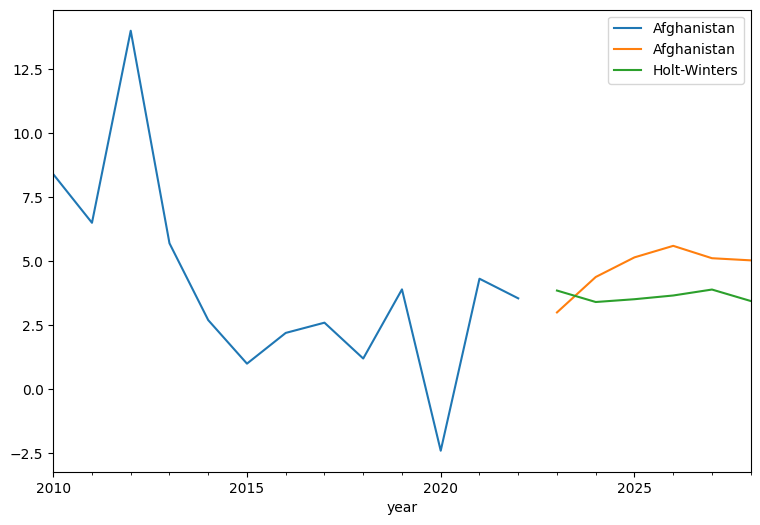

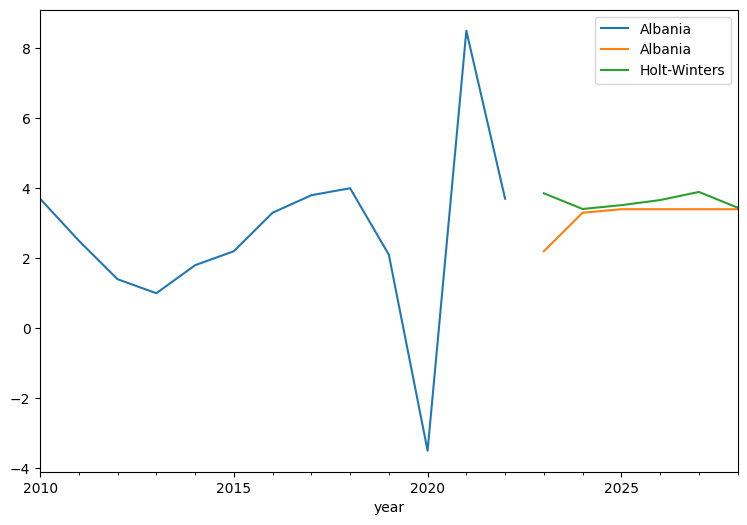

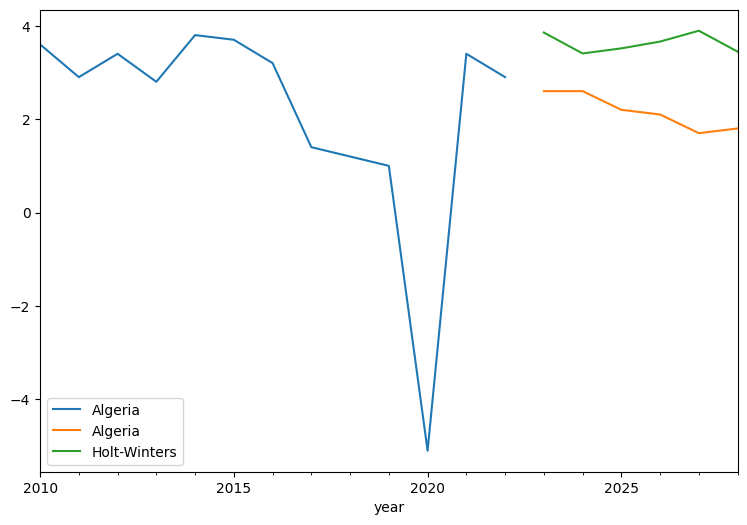

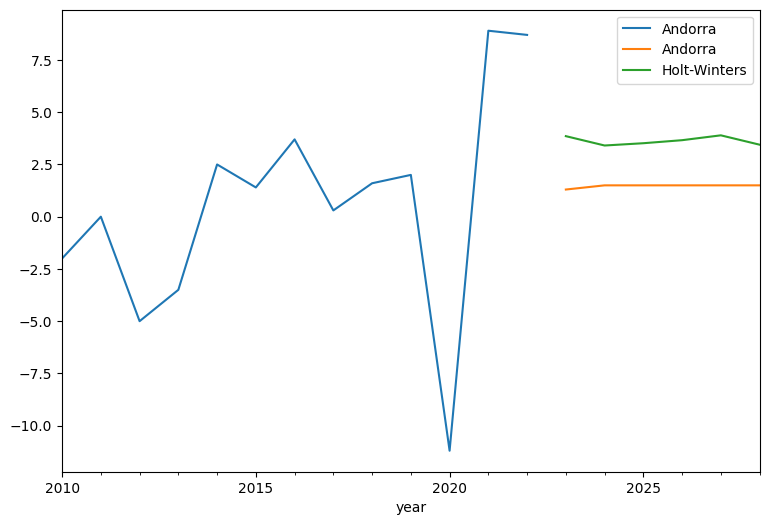

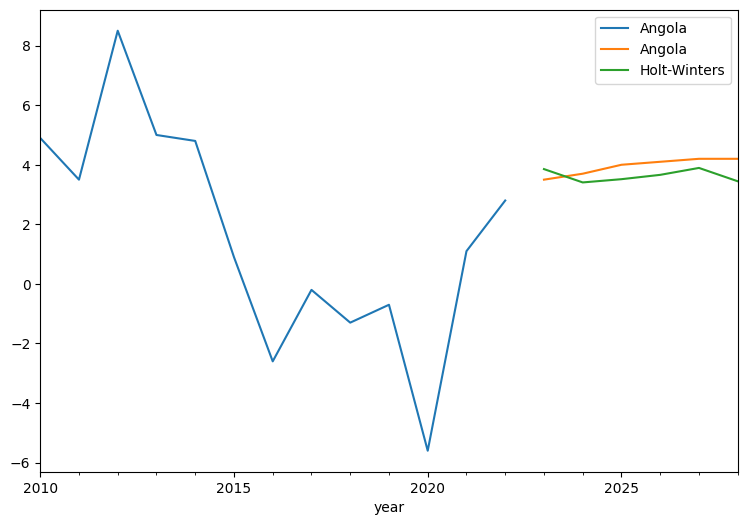

...

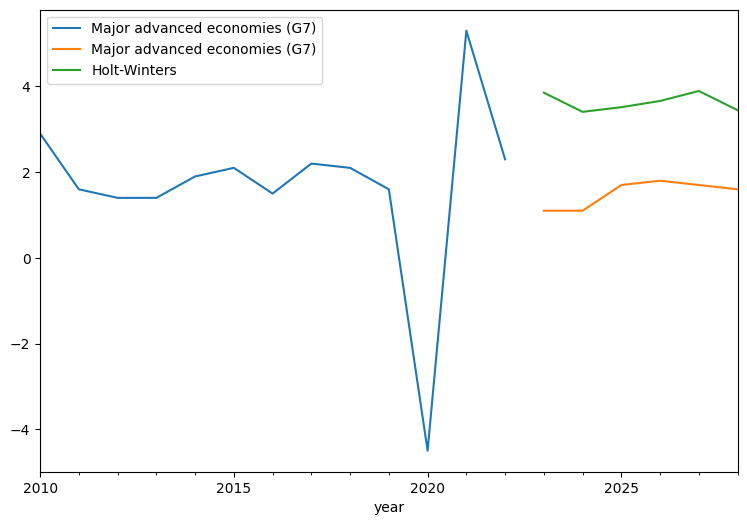

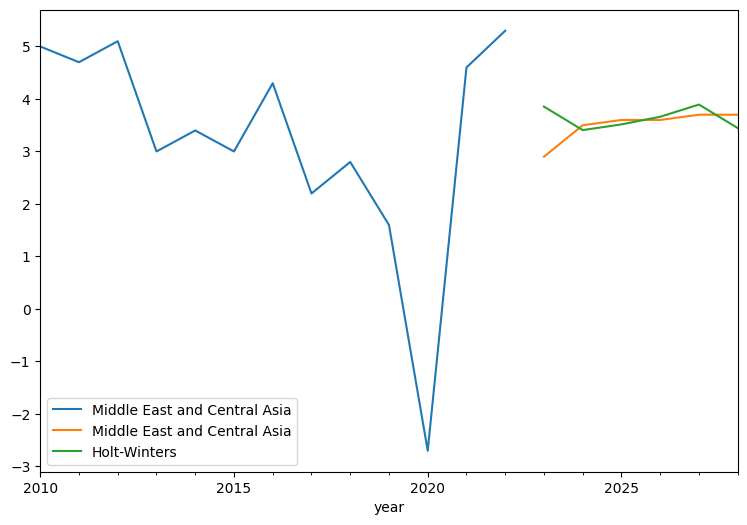

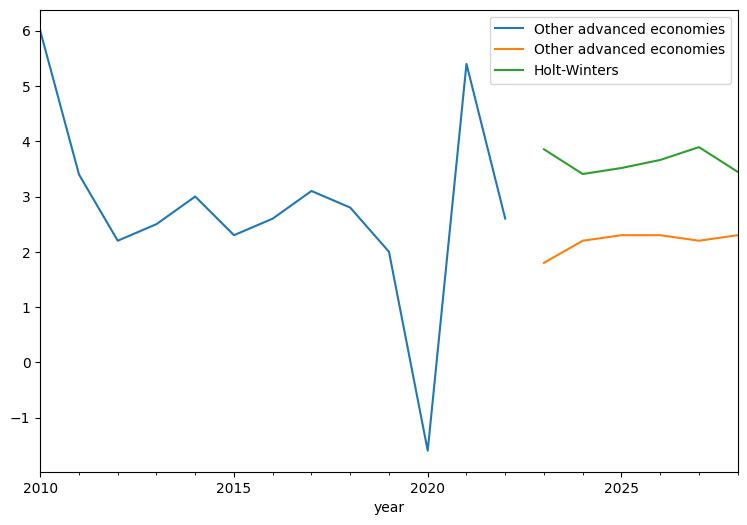

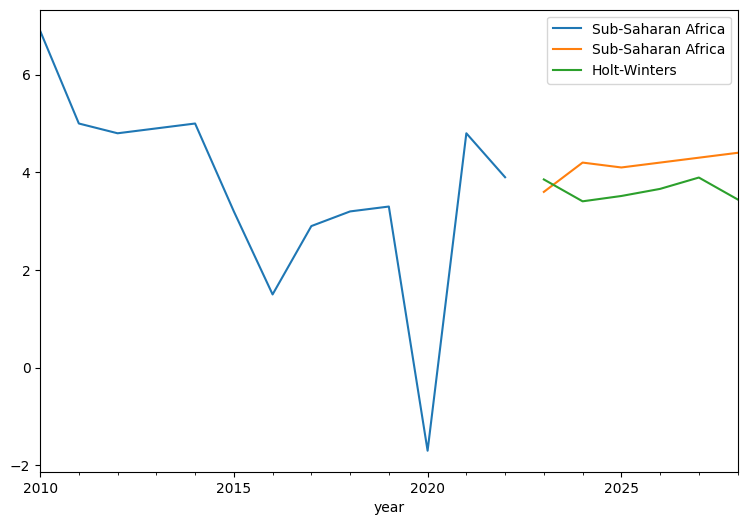

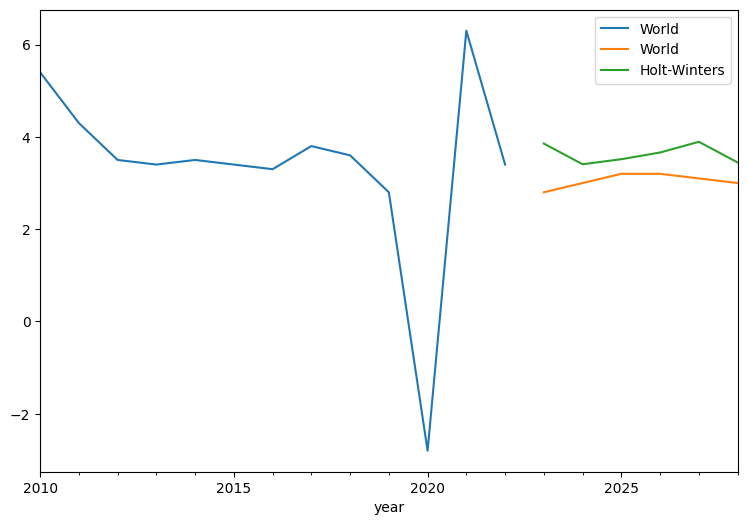

In [20]:
# Visualization
for country in df_model.columns: 
    plt.figure()
    train_data[country]['2010-01-01':].plot(figsize = (9,6), legend = True)
    test_data[country].plot(legend = True)
    predictions_hw.plot(legend = True)

#### KPIS de Avaliação do Modelo Holt-Winters
 Indicadores para medir a performance do modelo. MAE e RSME são indicadores de performance para modelos de regressão com variáveis dependentes contínuas. Não existem indicadores considerados 'perfeitos', existem os indicadores melhores apropriados para o problema analisado.

 - MAE - (Mean Absolute Error) É um indicador mais interpretável, utilizado quando a série temporal trata de taxas, porcentagens.
- RSME -  (Root Square Mean Error) São utilizados para modelos com outliers/extremos.
- MAPE - (Mean Absolute Percentage Error) Apesar de tratar os erros de forma absoluta é considerado um indicador mais agradável para comunicar a respeito do modelo. 

In [12]:
def MAPE(df_model_true, df_model_pred):
    df_model_true, df_model_pred = np.array(df_model_true), np.array(df_model_pred)
    return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100

metrics_hw = pd.DataFrame()
metrics_results = []
# Loop para métricas mae, rmse e mape
for country in df_model.columns:
    mae = round(mean_absolute_error(test_data[country].values, df_predictions_hw[country].values),2)
    rmse = round(np.sqrt(mean_squared_error(test_data[country], df_predictions_hw[country].values)), 2)
    mape = MAPE(test_data[country] , df_predictions_hw[country].values)

    metrics_results.append({
        "Country": country,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE": mape
    })

metrics_hw = pd.DataFrame(metrics_results)
metrics_hw.to_csv('../../Projeto/Data/Metrics/metrics_hw.csv', index = True)

/tmp/ipykernel_68076/1482644071.py:3: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100
/tmp/ipykernel_68076/1482644071.py:3: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100


#### Export forecasts for Holt-Winters

In [13]:
## Export forecast

df_predictions_hw.to_csv('../../Projeto/Data/Output/predictions_hw.csv', index = True)

### Modelo Simple Exponential Smoothing

In [14]:
# simple exponetial smooting
df_pred_simple_exp_smoot = pd.DataFrame()
for country in df_model.columns:
    model_simple_exp_smoot = SimpleExpSmoothing(
        train_data[country],
        initialization_method='heuristic',                              
    ).fit(smoothing_level=0.2, optimized=True)

    pred_simple_exp_smoot = model_simple_exp_smoot.forecast(test_data.shape[0])
    df_pred_simple_exp_smoot  = pd.concat([df_pred_simple_exp_smoot, pd.DataFrame(pred_simple_exp_smoot.values, columns=[country])], axis=1)


/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/pandas/util/_decorators.py:210: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/guest/DS/venv/lib/python3.8/site-packages/pandas/util/_decorators.py:210: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
/home/guest/DS/venv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provid

In [15]:
df_pred_simple_exp_smoot 

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
0,3.211023,3.219906,1.634848,2.251882,0.804211,1.403388,1.565403,5.11767,2.784584,2.637487,...,2.628389,4.081438,1.566052,1.879808,1.752267,1.61978,3.050696,2.568318,3.199518,3.09535
1,3.211023,3.219906,1.634848,2.251882,0.804211,1.403388,1.565403,5.11767,2.784584,2.637487,...,2.628389,4.081438,1.566052,1.879808,1.752267,1.61978,3.050696,2.568318,3.199518,3.09535
2,3.211023,3.219906,1.634848,2.251882,0.804211,1.403388,1.565403,5.11767,2.784584,2.637487,...,2.628389,4.081438,1.566052,1.879808,1.752267,1.61978,3.050696,2.568318,3.199518,3.09535
3,3.211023,3.219906,1.634848,2.251882,0.804211,1.403388,1.565403,5.11767,2.784584,2.637487,...,2.628389,4.081438,1.566052,1.879808,1.752267,1.61978,3.050696,2.568318,3.199518,3.09535
4,3.211023,3.219906,1.634848,2.251882,0.804211,1.403388,1.565403,5.11767,2.784584,2.637487,...,2.628389,4.081438,1.566052,1.879808,1.752267,1.61978,3.050696,2.568318,3.199518,3.09535
5,3.211023,3.219906,1.634848,2.251882,0.804211,1.403388,1.565403,5.11767,2.784584,2.637487,...,2.628389,4.081438,1.566052,1.879808,1.752267,1.61978,3.050696,2.568318,3.199518,3.09535


#### Visualização para Simple Exponential Smoothing

/tmp/ipykernel_68076/3659843260.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


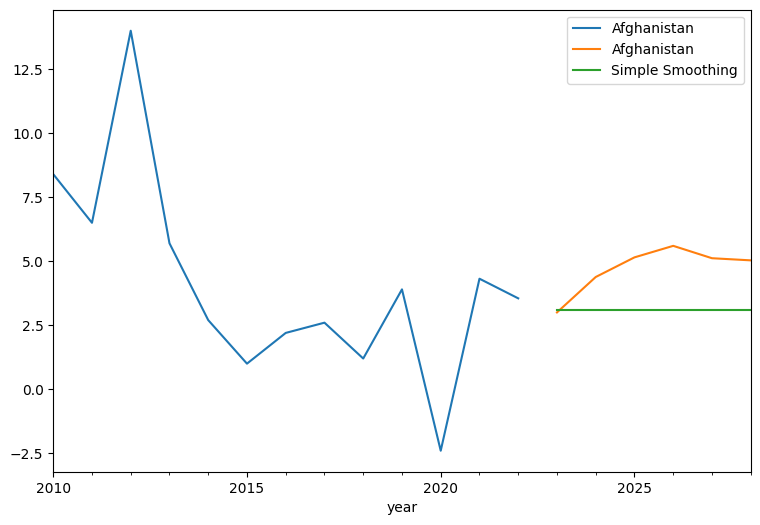

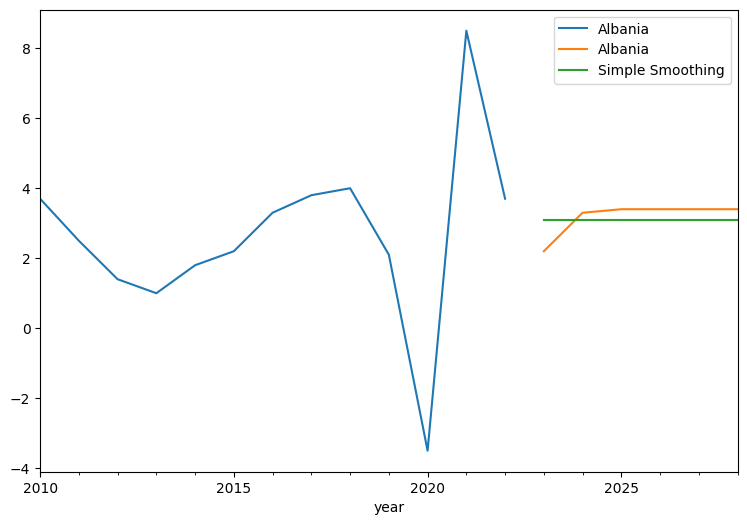

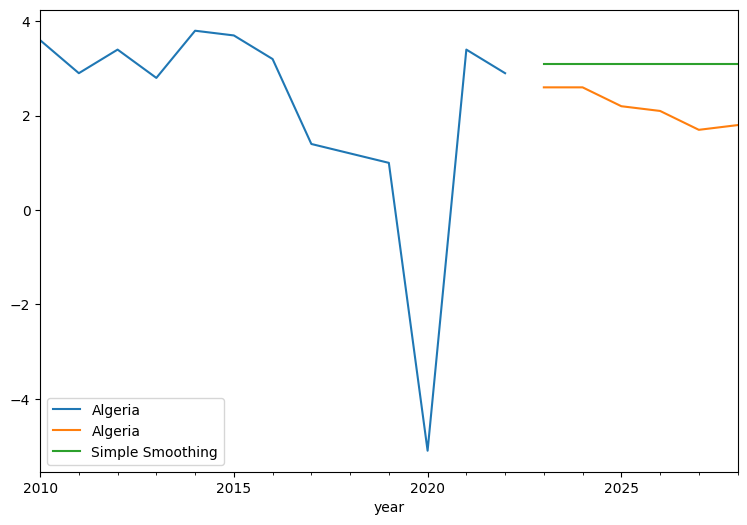

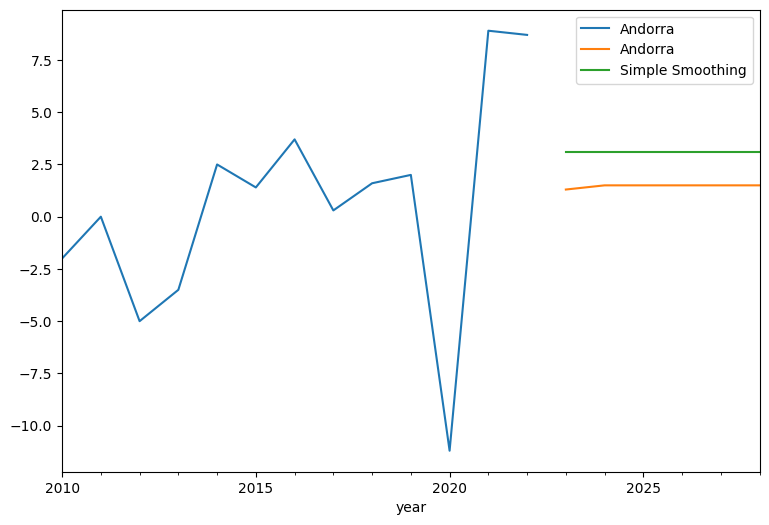

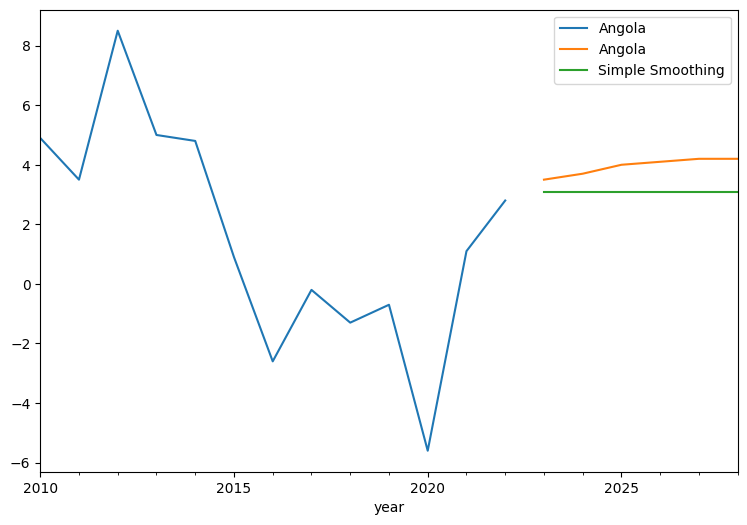

...

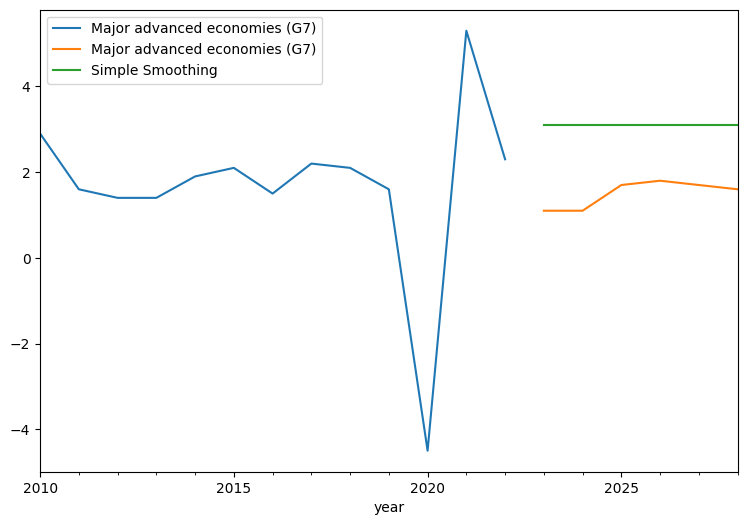

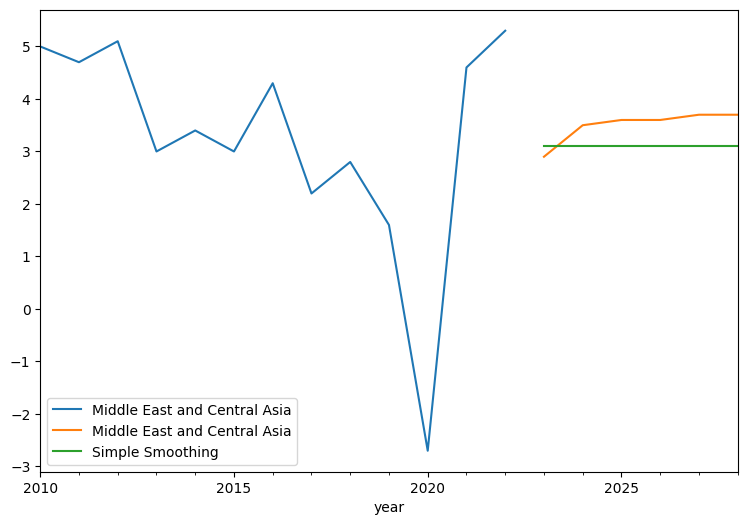

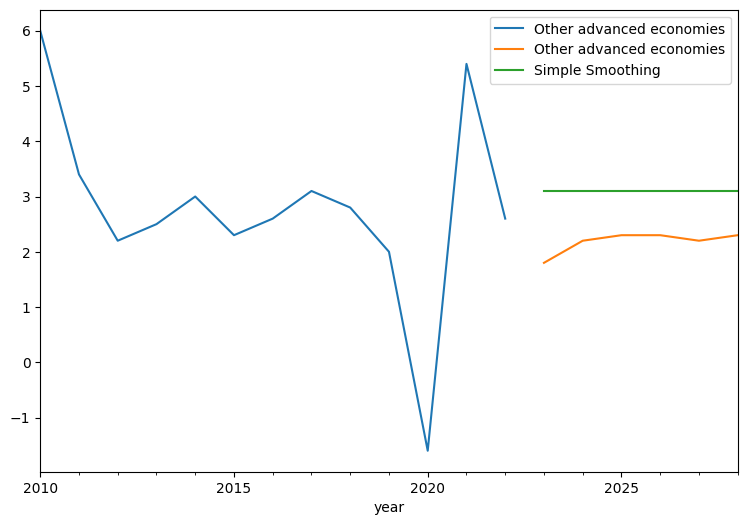

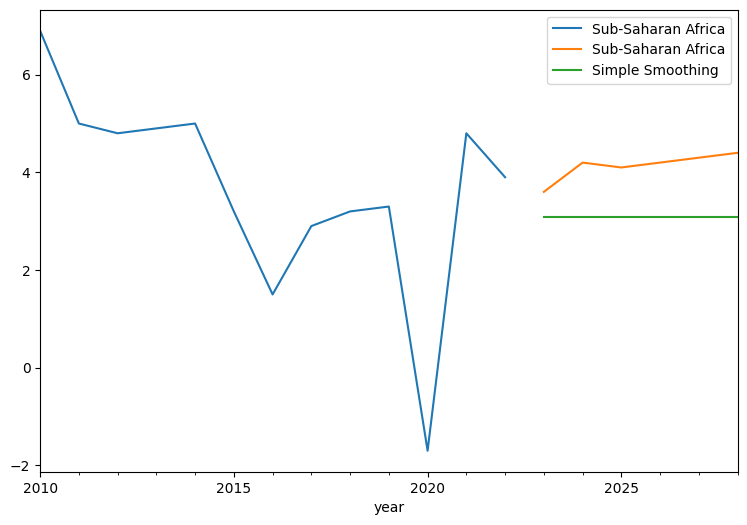

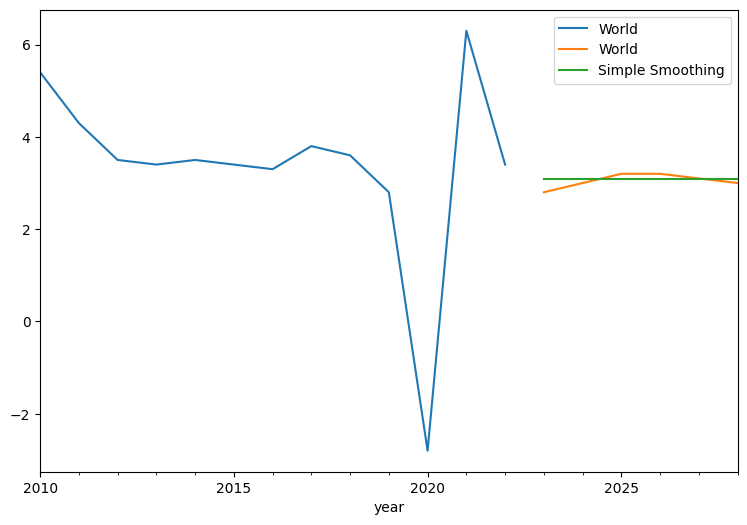

In [21]:
for country in df_model.columns:
    plt.figure()
    train_data[country]['2010-01-01':].plot(figsize = (9,6), legend = True)
    test_data[country].plot(legend = True)
    pred_simple_exp_smoot.plot(legend=True, label='Simple Smoothing')


#### KPIS para Simple Exponential Smoothing

In [17]:
def MAPE(df_model_true, df_model_pred):
    df_model_true, df_model_pred = np.array(df_model_true), np.array(df_model_pred)
    return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100

metrics_pred_simple_exp_smoot = pd.DataFrame()
metrics_results = []
# Loop para métricas mae, rmse e mape
for country in df_model.columns:
    mae = round(mean_absolute_error(test_data[country], df_pred_simple_exp_smoot[country].values),2)
    rmse = round(np.sqrt(mean_squared_error(test_data[country], df_pred_simple_exp_smoot[country].values)), 2)
    mape = MAPE(test_data[country], df_pred_simple_exp_smoot[country].values)

    metrics_results.append({
        "Country": country,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE": mape
    })

metrics_pred_simple_exp_smoot = pd.DataFrame(metrics_results)
metrics_pred_simple_exp_smoot.to_csv('../../Projeto/Data/Metrics/metrics_pred_simple_exp_smoot.csv', index = True)

/tmp/ipykernel_68076/3204549272.py:3: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100
/tmp/ipykernel_68076/3204549272.py:3: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100


#### Export forecast para Simple Exponential Smoothing

In [18]:
## Export forecast

df_pred_simple_exp_smoot.to_csv('../../Projeto/Data/Output/predictions_simple_exponential.csv', index = True)

### Comparação de Métricas entre Modelos Holt-Winters e Simple Exponential Smoothing

DataFrame: Holt-Winters
Métrica: MAE
mean      2.515088
median    1.335000
std       5.304481
Name: MAE, dtype: float64


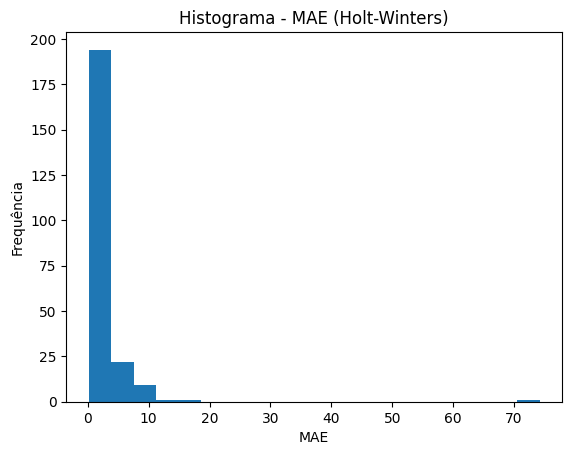



Top 20 MAE (Holt-Winters):
                     Country    MAE   RMSE         MAPE
71                    Guyana  74.20  83.57  1676.386976
102                Macao SAR  17.22  26.03   122.474409
183                  Ukraine  13.65  13.71   455.053750
106                 Maldives  10.63  14.40   186.635787
53         Equatorial Guinea   9.96  10.74   747.846942
193                    Yemen   9.19   9.55   380.215846
118               Mozambique   9.14  10.79    96.601838
165                 Suriname   9.05   9.19   315.115068
148                    Samoa   8.01   8.09   249.667423
81                   Ireland   7.80   7.93   227.912155
132                    Palau   7.70   8.11   149.658947
161  Republic of South Sudan   7.65   8.19   166.293439
199                Caribbean   6.53   8.10   245.723919
80                      Iraq   6.51   7.84   249.498864
99                     Libya   6.34   8.96    78.853588
114                  Moldova   6.00   6.70   128.543024
121                

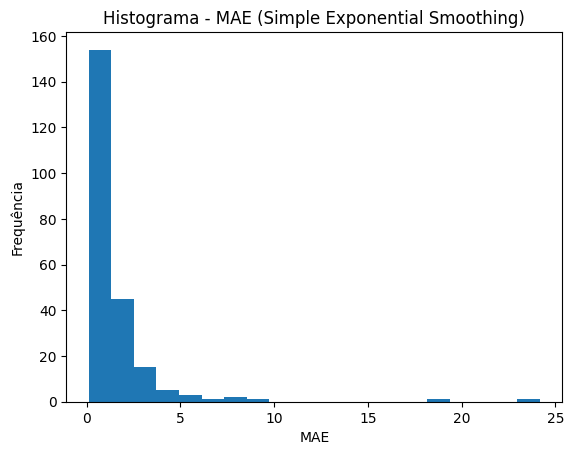



Top 20 MAE (Simple Exponential Smoothing):
                     Country    MAE   RMSE         MAPE
102                Macao SAR  24.17  31.29   227.562318
71                    Guyana  18.18  18.48   318.543384
190                Venezuela   9.61   9.95   826.014852
132                    Palau   8.44   8.85   165.010867
99                     Libya   8.41   9.53   105.742381
193                    Yemen   6.88   7.40   195.640397
118               Mozambique   5.39   7.01    50.422280
199                Caribbean   5.12   6.71    57.455418
81                   Ireland   5.10   5.19   150.382396
161  Republic of South Sudan   4.80   4.82   102.955048
148                    Samoa   4.77   4.85   146.712189
40         Republic of Congo   4.50   4.51   111.131379
165                 Suriname   4.32   4.33   150.326229
168                    Syria   3.76   6.18  1299.505347
28                   Burundi   3.64   3.76    66.116492
96                   Lebanon   3.52   3.69    36.631070
164

In [19]:

# Lista de métricas
metrics = ['MAE']

# Dicionário de DataFrames com seus respectivos nomes
dataframes = {
    'Holt-Winters': metrics_hw,
    'Simple Exponential Smoothing': metrics_pred_simple_exp_smoot
}

# Iterar sobre os DataFrames e as métricas
for df_name, df in dataframes.items():
    print(f"DataFrame: {df_name}")
    
    for metric in metrics:
        print(f"Métrica: {metric}")
        
        # Agregar as estatísticas
        aggregated = df[metric].agg(['mean', 'median', 'std'])
        print(aggregated)
        
        # Gerar histograma
        plt.hist(df[metric], bins=20)
        plt.title(f"Histograma - {metric} ({df_name})")
        plt.xlabel(metric)
        plt.ylabel("Frequência")
        plt.show()

        print("\n")

    # Mostrar os top 20 valores maiores de MAE
    top_20 = df.sort_values(by='MAE', ascending=False).head(20)
    print(f"Top 20 MAE ({df_name}):\n{top_20}\n")
